## Import and define functions

In [1]:
import os
import warnings
import random
import pickle
from datetime import datetime
from collections import defaultdict
from functools import partial

# Environment configuration
os.environ['JAX_PLATFORMS'] = 'cpu'
os.environ['XLA_FLAGS'] = '--xla_force_host_platform_device_count=8'

import numpyro
from numpyro import distributions as dist
from numpyro.infer import MCMC, NUTS, log_likelihood, hmc
from numpyro.infer.util import initialize_model
from numpyro.util import fori_collect

import jax
from jax import config
config.update("jax_enable_x64", True)
config.update('jax_platform_name', 'cpu')

import jax.numpy as jnp
from jax import jit, pmap, devices, device_get, lax, local_device_count, random, vmap, block_until_ready
from jax.random import PRNGKey, split
from jax.scipy.optimize import minimize
from jax.scipy.signal import fftconvolve
from jax.scipy.signal import convolve as jax_convolve

# Check devices
print('Available devices:', devices())
print('CPU devices:', devices('cpu'))

# Suppress warnings
warnings.filterwarnings('ignore', message="It appears that you're using a Mac with one of Apple's ARM-based processors")

import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.animation as animation
from matplotlib.gridspec import GridSpec
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize, to_hex
import corner

import astropy.units as u
import astropy.constants as c
from astropy.constants import G, m_p
from astropy.table import Table

import shone

import fleck
from fleck.jax import ActiveStar

from scipy.optimize import fmin_powell, curve_fit
from scipy.stats import gaussian_kde


from chromatic import *
from svo_filters import svo
from sphinx import get_interp_stellar_spectrum

import arviz
import arviz as az

from tqdm.auto import tqdm

example_sphinx_file = pd.read_csv('../../../../model-spectra/sphinx/SPECTRA/Teff_2000.0_logg_4.5_logZ_-0.5_CtoO_0.3_spectra.txt',
                             comment='#',delimiter=r'\s+',
                             names=['wavelength', 'flux']
                             )
panchromatic_wavelengths = example_sphinx_file['wavelength'].values
# half_diffs = np.diff(panchromatic_wavelengths) / 2.0
# bin_edges = np.zeros(len(panchromatic_wavelengths) + 1)
# bin_edges[0] = panchromatic_wavelengths[0] - half_diffs[0]
# bin_edges[1:-1] = panchromatic_wavelengths[:-1] + half_diffs
# bin_edges[-1] = panchromatic_wavelengths[-1] + half_diffs[-1]
# panchromatic_bin_edges = bin_edges
panchromatic_sphinx_grid = get_interp_stellar_spectrum(panchromatic_wavelengths)

species = ['H2O', 'CH4', 'CO2', 'CO','NH3']

visits = {
    'F21': {
        'Grism': 'G141',
        # 'Forward': G_141_for_dict,
        # 'Backward': G_141_back_dict,
        'BJD_times': np.array(pd.read_csv('../../data/F21_bjdtimes.csv')['BJD'][:]) * u.day,
        'time_lower': 2459455.708 * u.day,
        'time_upper': 2459455.738 * u.day,
        'T0 (BJD_TDB)': 2459455.9895 * u.day,
        'exp (s)': 4.9784 * u.s,
        'native resolution': 46.3 * u.angstrom
    },
    'S22': {
        'Grism': 'G102',
        # 'Forward': G_102_for_dict,
        # 'Backward': G_102_back_dict,
        'BJD_times': np.array(pd.read_csv('../../data/S22_bjdtimes.csv')['BJD'][:]) * u.day,
        'time_lower': 2459684.215 * u.day,
        'time_upper': 2459684.243 * u.day,
        'T0 (BJD_TDB)': 2459684.4959 * u.day, # This is 27 planetary orbits after the first transit, + 0.0054 days (the transit arrived 7 minutes late)
        'exp (s)': 9.67632 * u.s,
        'native resolution': 24.6 * u.angstrom
    }
}

systeminfo = {
    'duration (hr)': 3.5 * u.hr,
    'T_orb (d)': 8.463 * u.day,
    'T_rot (d)': 4.86 * u.day,
    'inclination': 89.5,
    'eccentricity': 0.0,
    'longitude_of_periastron': 88.4
}

def read_sensitivity_curve(grism='G141'):
    path = f'../../data/WFC3.IR.{grism}.1st.sens.2.fits'

    response = fits.open(path)

    w = response[1].data['wavelength']/1e4 * u.micron
    s = response[1].data['sensitivity'] * u.cm * u.cm / u.erg
    e = response[1].data['error'] * u.cm * u.cm / u.erg
    
    return w, s, e

@jit
def get_planck_spectrum_jax(T, **kwargs):
    """
    Calculate the surface flux from a thermally emitted surface,
    according to Planck function.

    Parameters
    ----------
    wavelength : Quantity
        The wavelengths at which to calculate,
        with units of wavelength.
    temperature : Quantity
        The temperature of the thermal emitter,
        with units of K.

    Returns
    -------
    surface_flux : Quantity
        The surface flux, evaluated at the wavelengths.
    """

    # define variables as shortcut to the constants we need
    h = 6.62607e-27 # erg s
    k = 1.380649e-16 # erg/K
    c = 2.9979e18 # angstrom/s
    wavelength = panchromatic_wavelengths*1e4

    z = h * c / (wavelength * k * T) # units check out

    # calculate the intensity from the Planck function
    intensity = (2 * h * c**2 / wavelength**5 / (jnp.exp(z) - 1)) # Units are erg/s/A^3

    # calculate the flux assuming isotropic emission
    flux = jnp.pi * intensity * 1e16 # erg / (s * cm^2 * angstrom)

    # return the intensity
    wave_jax = jnp.array(panchromatic_wavelengths)
    flux_jax = jnp.array(flux)

    return wave_jax, flux_jax

@jit
def convolve_spectrum_jax(model_wavelength, model_flux, sigma, kernel_size=7, **kwargs):
    """
    Properly convolve a spectrum with a Gaussian kernel in JAX.
    
    Args:
        model_wavelength: Array of wavelengths (must be evenly spaced!)
        model_flux: Corresponding flux values
        sigma: Standard deviation of Gaussian kernel in wavelength units
        kernel_size: Number of elements in the kernel (odd number recommended)
        
    Returns:
        Convolved flux array
    """
    # Ensure inputs are JAX arrays
    model_wavelength = jnp.asarray(model_wavelength)
    model_flux = jnp.asarray(model_flux)
    
    # Create proper Gaussian kernel
    x = jnp.linspace(-(kernel_size//2), kernel_size//2, kernel_size)
    kernel = jnp.exp(-0.5 * (x/sigma)**2)
    kernel = kernel / jnp.sum(kernel)  # normalize
    
    # Perform convolution
    convolved = jax_convolve(model_flux, kernel, mode='same', method='fft')
    
    return convolved

@jit
def get_sphinx_spectrum_jax(T, logg, metallicity, CtoO, grid=panchromatic_sphinx_grid, **kwargs):
    
    # Fix: Create a tuple of the three values, then convert to array
    gridspec = grid(
        jnp.array(T, dtype=jnp.float64),
        jnp.array(logg, dtype=jnp.float64),
        jnp.array(metallicity, dtype=jnp.float64),
        jnp.array(CtoO, dtype=jnp.float64)
    )
    
    # Calculate the normalization factor
    # sigma_sb = 5.67e-5  # erg/cm^2/s
    # nf = (sigma_sb * (T)**4) / (jnp.trapezoid(gridspec, x=jnp.array(panchromatic_wavelengths)*1e4))
    re_normed_flux = gridspec #* nf
    
    wave_jax = jnp.array(panchromatic_wavelengths)
    flux_jax = jnp.array(re_normed_flux)
    
    return wave_jax, flux_jax

Available devices: [CpuDevice(id=0), CpuDevice(id=1), CpuDevice(id=2), CpuDevice(id=3), CpuDevice(id=4), CpuDevice(id=5), CpuDevice(id=6), CpuDevice(id=7)]
CPU devices: [CpuDevice(id=0), CpuDevice(id=1), CpuDevice(id=2), CpuDevice(id=3), CpuDevice(id=4), CpuDevice(id=5), CpuDevice(id=6), CpuDevice(id=7)]


2026-03-26 13:55:52,778 - WARNING - File .dacerc not found. You are requesting data in public mode. To change this behaviour, create a .dacerc file in your home directory and fill it with your API key. More infos on https://dace.unige.ch
/opt/anaconda3/envs/pyjax312/lib/python3.12/site-packages/chromatic/imports.py:18: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  import copy, pkg_resources, os, glob, pickle


In [2]:
rng_seed = 0

def hstack_recursive(final_states, checkpoint_states):
    for key in final_states.keys():
        if isinstance(final_states[key], dict):
            hstack_recursive(final_states[key], checkpoint_states[key])
        else:
            final_states[key] = jnp.hstack([
                final_states[key], 
                checkpoint_states[key]
            ])

def print_big_message(big_message):
    print('\n\n')
    print('=' * len(big_message))
    print(big_message)
    print('=' * len(big_message))
    print('\n\n')

def post_batch_viz_save(self, **kwargs):
    """
    here we define some tasks to do after each completed checkpoint:
    """
    print(f'Corner for checkpoint {self.checkpoint}')

    samples_cumulative = self.get_samples()
    corner.corner(samples_cumulative)
    plt.suptitle(f'checkpoint {self.checkpoint}')
    plt.savefig(f'../../figs/jointvisit_chkpt_{self.checkpoint}_SED_corner.png', dpi=200)
    plt.show()
    plt.clf()
    
    # EXTRACT MEDIAN PARAMETERS DIRECTLY FROM SAMPLES (like corner plot does)
    chkpt_median_params = {}
    for param_name, param_samples in samples_cumulative.items():
        # param_samples has shape (num_chains, num_samples)
        # Flatten across chains and compute median
        flattened_samples = param_samples.flatten()
        chkpt_median_params[param_name] = float(jnp.median(flattened_samples))
    
    print("Median parameters from samples:")
    for param, value in chkpt_median_params.items():
        print(f"  {param}: {value:.6f}")
    
    # Calculate and print maximum log likelihood
    if 'log_likelihood' in samples_cumulative:
        log_lik_samples = samples_cumulative['log_likelihood'].flatten()
        max_log_lik = float(jnp.max(log_lik_samples))
        print(f"Maximum log likelihood: {max_log_lik:.6f}")
        
        # Also compute Bayesian Information Criterion (BIC) if you want
        n_params = len([p for p in samples_cumulative.keys() if p != 'log_likelihood'])
        n_data = len(SED_wavelengths_G102) + len(SED_wavelengths_G141)  # number of data points
        bic = -2 * max_log_lik + n_params * jnp.log(n_data)
        print(f"BIC: {bic:.6f}")

    with open(f'../../data/samples/samples_cumulative_{self.start_time}_checkpoint_{self.checkpoint:04d}.pkl', 'wb') as file:
        pickle.dump(dict(samples_cumulative), file)

class MCMCWithCheckpoints(MCMC):
    running_states = None
    checkpoint = 0
    start_time = None
    
    def run_checkpoints(self, rng_key, *args, extra_fields=(), n_checkpoints=10, 
                        progress_bar_warmup=True, progress_bar_samples=True, 
                        init_params=None, on_checkpoint=None, **kwargs):
        """
        Run the MCMC samplers and collect samples.

        :param random.PRNGKey rng_key: Random number generator key to be used for the sampling.
            For multi-chains, a batch of `num_chains` keys can be supplied. If `rng_key`
            does not have batch_size, it will be split in to a batch of `num_chains` keys.
        :param args: Arguments to be provided to the :meth:`numpyro.infer.mcmc.MCMCKernel.init` method.
            These are typically the arguments needed by the `model`.
        :param extra_fields: Extra fields (aside from `"z"`, `"diverging"`) from the
            state object (e.g. :data:`numpyro.infer.hmc.HMCState` for HMC) to be collected
            during the MCMC run. Note that subfields can be accessed using dots, e.g.
            `"adapt_state.step_size"` can be used to collect step sizes at each step. Exclude sample sites from
            collection with "~`sampler.sample_field`.`sample_site`". e.g. "~z.a" will prevent site "a" from
            being collected if you're using the NUTS sampler. To collect samples of a site "a" in the
            unconstrained space, we can specify the variable here, e.g. `extra_fields=("z.a",)`.
        :type extra_fields: tuple or list of str
        :param init_params: Initial parameters to begin sampling. The type must be consistent
            with the input type to `potential_fn` provided to the kernel. If the kernel is
            instantiated by a numpyro model, the initial parameters here correspond to latent
            values in unconstrained space.
        :param kwargs: Keyword arguments to be provided to the :meth:`numpyro.infer.mcmc.MCMCKernel.init`
            method. These are typically the keyword arguments needed by the `model`.

        .. note:: jax allows python code to continue even when the compiled code has not finished yet.
            This can cause troubles when trying to profile the code for speed.
            See https://jax.readthedocs.io/en/latest/async_dispatch.html and
            https://jax.readthedocs.io/en/latest/profiling.html for pointers on profiling jax programs.
        """
        self.start_time = datetime.now().strftime("%Y-%m-%d_%H-%M")
        num_warmup_total = int(self.num_warmup)
        num_samples_total = int(self.num_samples)
        
        check_point_indices = [
            jnp.arange(num_warmup_total), 
            *jnp.array_split(jnp.arange(num_samples_total), n_checkpoints)
        ]
        n_checkpoints = len(check_point_indices)
        rng_keys = random.split(rng_key, n_checkpoints)
        pbar = tqdm(enumerate(zip(rng_keys, check_point_indices)), total=n_checkpoints)
        for checkpoint, (rng_key, bounds) in pbar:
            if checkpoint == 0:
                self.progress_bar = progress_bar_warmup
                pbar.set_description('Run warmup')
                print_big_message("Begin warmup")
                self.warmup(rng_key, *args, extra_fields=extra_fields, init_params=init_params, **kwargs)
                print_big_message(f"Begin {num_samples_total} samples with {n_checkpoints} checkpoints")

            else:
                pbar.set_description(f'Run samples {bounds.min()} to {bounds.max()}')

                self.progress_bar = progress_bar_samples
                self.num_samples = bounds.size
                self.run(rng_key, *args, extra_fields=extra_fields, init_params=init_params, **kwargs)

                # add to running states:
                if self.running_states is None:
                    self.running_states = dict(self._states)
                else:
                    hstack_recursive(self.running_states, self._states)
                
                # ensure that calls to `self.get_samples` will build a new samples array
                # out of the running states:
                self._states_flat = None
                self._states = self.running_states

                if on_checkpoint is not None:
                    on_checkpoint(self, **kwargs)
                self.checkpoint += 1
        
        pbar.close()

        # reset to total number for arviz IO
        self.num_samples = num_samples_total

## Load and prepare data

🌈🤖 The time scale for this rainbow is '?',
and there are 160 time centers and
160 time edges defined.

It's hard to imshow something with a time axis
that isn't linearly or logarithmically uniform, or doesn't
at least have its time edges defined. We're giving up
and just using the time index as the time axis.

If you want a real time axis, one solution would be
to use `rainbow.pcolormesh()` instead of `rainbow.imshow()`.
It takes basically the same inputs but can handle non-uniform
grids.

Or, you could bin your times to a more uniform grid with
`binned = rainbow.bin(dt=...)` (for linear times) and then
`binned.imshow()` will give more informative axes.



  0%|          | 0/138 [00:00<?, ?it/s]

  0%|          | 0/110 [00:00<?, ?it/s]

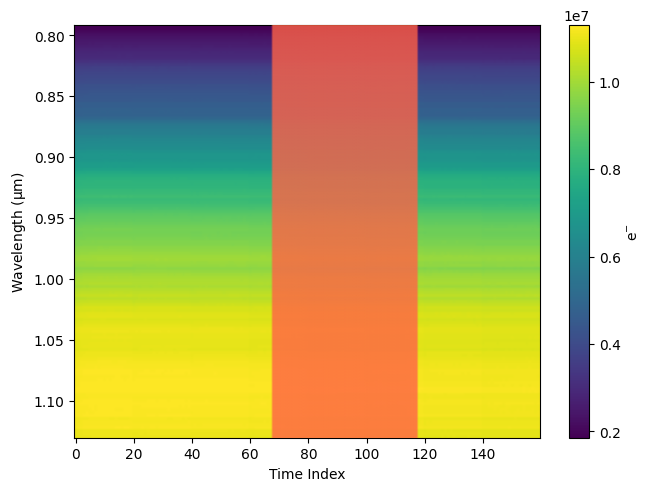

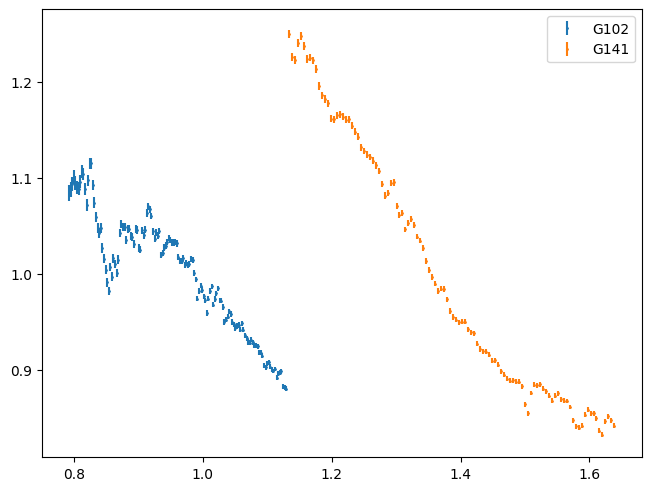

<Figure size 640x480 with 0 Axes>

In [3]:
visit = 'S22'

'Things that automatically get re-defined for either visit'
predicted_T0 = visits[f'{visit}']['T0 (BJD_TDB)'].value
binwidth = visits[f'{visit}']['native resolution']
exptime = visits[f'{visit}']['exp (s)']
grism = visits[f'{visit}']['Grism']
rainbow = read_rainbow(f"../../data/rainbows/{visit}_scan-combined_trimmed_pacman_spec.rainbow.npy")
speclc_rainbow = rainbow

'remove the transit'
out_of_transit = ( speclc_rainbow.trim().mask_transit(period=8.463*u.day, t0=predicted_T0*u.day, duration=0.15*u.day) )

out_of_transit.imshow()
'define the appropriate arrays'
_meanOOTspec = out_of_transit.get_average_spectrum_as_rainbow()
meanOOTspec = _meanOOTspec.flux
meanOOTspec_relative_err = _meanOOTspec.uncertainty.value/meanOOTspec.value
oot_spec_err = meanOOTspec_relative_err.flatten()
_SED_wavelengths = (_meanOOTspec.wavelength.value).flatten()
e_per_s = meanOOTspec / exptime
e_per_s_per_angstrom = e_per_s / binwidth
_w, _s, _e = read_sensitivity_curve(grism=grism)
binned_filter_response = bintogrid(_w.value, _s.value, newx=_SED_wavelengths)['y'] * u.cm**2 / u.erg
_calibrated_mean_spec = e_per_s_per_angstrom.flatten() / binned_filter_response
calibrated_mean_spec = _calibrated_mean_spec.value/np.nanmean(_calibrated_mean_spec.value)
oot_spec_err = oot_spec_err * calibrated_mean_spec

# Convert to JAX arrays
calibrated_mean_spec_G102 = jnp.array(calibrated_mean_spec)
oot_spec_err_G102 = jnp.array(oot_spec_err)
SED_wavelengths_G102 = jnp.array(_SED_wavelengths)

######## NOW DO THAT FOR F21 ##############
visit = 'F21'

'Things that automatically get re-defined for either visit'
predicted_T0 = visits[f'{visit}']['T0 (BJD_TDB)'].value
binwidth = visits[f'{visit}']['native resolution']
exptime = visits[f'{visit}']['exp (s)']
grism = visits[f'{visit}']['Grism']
rainbow = read_rainbow(f"../../data/rainbows/{visit}_scan-combined_trimmed_pacman_spec.rainbow.npy")
speclc_rainbow = rainbow


'remove the transit'
out_of_transit = ( speclc_rainbow.trim().mask_transit(period=8.463*u.day, t0=predicted_T0*u.day, duration=0.15*u.day) )

'define the appropriate arrays'
_meanOOTspec = out_of_transit.get_average_spectrum_as_rainbow()
meanOOTspec = _meanOOTspec.flux
meanOOTspec_relative_err = _meanOOTspec.uncertainty.value/meanOOTspec.value
_oot_spec_err = meanOOTspec_relative_err.flatten()
_SED_wavelengths = (_meanOOTspec.wavelength.value).flatten()
e_per_s = meanOOTspec / exptime
e_per_s_per_angstrom = e_per_s / binwidth
_w, _s, _e = read_sensitivity_curve(grism=grism)
binned_filter_response = bintogrid(_w.value, _s.value, newx=_SED_wavelengths)['y'] * u.cm**2 / u.erg
_calibrated_mean_spec = e_per_s_per_angstrom.flatten() / binned_filter_response
calibrated_mean_spec = _calibrated_mean_spec.value/np.nanmean(_calibrated_mean_spec.value)
oot_spec_err = _oot_spec_err * calibrated_mean_spec

# Convert to JAX arrays
calibrated_mean_spec_G141 = jnp.array(calibrated_mean_spec)
oot_spec_err_G141 = jnp.array(oot_spec_err)
SED_wavelengths_G141 = jnp.array(_SED_wavelengths)

plt.figure()
plt.errorbar(SED_wavelengths_G102,calibrated_mean_spec_G102,yerr=oot_spec_err_G102*100,fmt='o',label='G102',ms=1)
plt.errorbar(SED_wavelengths_G141,calibrated_mean_spec_G141,yerr=oot_spec_err_G141*100,fmt='o',label='G141',ms=1)
plt.legend()
plt.show()
plt.clf()

## Define the Numpyro Model

In [4]:
def numpyro_model(N_temps=2, return_max_likelihood=False):
    """
    Define the probabilistic model in NUMPYRO with N_temps components.
    
    Args:
        N_temps: Number of temperature components (1, 2, 3, or 4)
        return_max_likelihood: If True, also return the maximum log likelihood value
    """
    # This function is the actual model that NumPyro will call
    def model():
        # Temperature parameters - T1 now in higher range (3700-4500)
        temp_bounds = [
            (3600, 4000),   # T1 bounds (higher temperature)
            (3000, 3600),   # T2 bounds (cooler component)
            (2000, 4000),   # T3 bounds 
        ]
        ff_bounds = [
            (0, 0),   # T1 bounds (higher temperature)
            (-3, 1),   # T2 bounds (cooler component)
            (-3, 1),   # T3 bounds 
        ]
        
        # Sample temperatures
        T_samples = []
        for i in range(1, N_temps + 1):
            if i == 2:
                delta_T2 = numpyro.sample('delta_T2', dist.Uniform(-1600,-200))
                T = numpyro.deterministic(f'T{i}', T_samples[0] + delta_T2)
            else:
                T = numpyro.sample(f'T{i}', dist.Uniform(*temp_bounds[i-1]))
                
            T_samples.append(T)
        
        # Sample scale factors for components 2..N
        ff_samples = [1.0]  # First component always has f=1
        for i in range(2, N_temps + 1):
            ff = 10**numpyro.sample(f'ff{i}', dist.Uniform(*ff_bounds[i-1]))
            ff_samples.append(ff)

        # NEW: Sample metallicity and C/O ratio
        metallicity = 0.0 #numpyro.sample('metallicity', dist.Uniform(-0.5, 0.5))
        cto_ratio = numpyro.sample('cto_ratio', dist.Uniform(0.3, 0.9))
        log_g = 4.5 #numpyro.sample('log_g', dist.Uniform(4.0, 5.0))

        # Other parameters
        offset_G102 = numpyro.sample('offset_G102', dist.Uniform(0.2, 0.8))
        slope_G141 = numpyro.sample('slope_G141', dist.Uniform(-0.6, 0.6))
        slope_G102 = numpyro.sample('slope_G102', dist.Uniform(-0.6, 0.6))
        sigma_conv = numpyro.sample('sigma_conv', dist.Uniform(0.05, 2))
        beta_102 = numpyro.sample('beta_G102', dist.Uniform(2.0, 2.7))
        beta_141 = numpyro.sample('beta_G141', dist.Uniform(2.0, 2.5))

        # Adjust and concatenate data with slopes applied
        offset_102 = jnp.asarray(offset_G102, dtype=jnp.float64)
        spec_G102_with_offset = jnp.array(calibrated_mean_spec_G102 + offset_102)

        spec_G102_with_slope = spec_G102_with_offset + slope_G102 * (SED_wavelengths_G102 - SED_wavelengths_G102[0])
        spec_G141_with_slope = jnp.array(calibrated_mean_spec_G141) + slope_G141 * (SED_wavelengths_G141 - SED_wavelengths_G141[0])
        
        # Concatenate the spectra
        _spec_flux_jax = jnp.concatenate([spec_G102_with_slope, spec_G141_with_slope])
        spec_flux_jax = _spec_flux_jax / jnp.mean(_spec_flux_jax)
        spec_err_jax = jnp.concatenate(
            [
                jnp.array((10**beta_102) * oot_spec_err_G102),
                jnp.array((10**beta_141) * oot_spec_err_G141)
            ]
        )
        combined_SED_wavelengths = jnp.concatenate([jnp.array(SED_wavelengths_G102), 
                                                    jnp.array(SED_wavelengths_G141)])
        
        @jit
        def decomp_model(temps, scales, log_g, metal, cto, sigma):
            # Get spectra for all temperatures with variable metallicity and C/O
            spectra = [get_sphinx_spectrum_jax(T=Temp, logg=log_g, metallicity=metal, CtoO=cto) for Temp in temps]
            
            # Calculate combined spectrum with scaling factors
            flux_combined = scales[0] * spectra[0][1]  # Start with first component
            for i in range(1, N_temps):
                flux_combined += scales[i] * spectra[i][1]
            
            # Normalize
            _model_flux = flux_combined / jnp.mean(flux_combined)
            
            _binned_model_flux = shone.bin_spectrum(
                combined_SED_wavelengths, 
                panchromatic_wavelengths, 
                _model_flux
            )
            # Convolve and bin
            binned_model_flux = convolve_spectrum_jax(
                panchromatic_wavelengths, 
                _binned_model_flux, 
                sigma=jnp.asarray(sigma, dtype=jnp.float64)
            )

            model_flux = binned_model_flux / jnp.mean(binned_model_flux)
            
            return model_flux[2:-4]

        # Calculate model flux with metallicity and C/O
        model_flux = decomp_model(T_samples, ff_samples, log_g, metallicity, cto_ratio, sigma_conv)
        
        # Define the likelihood
        log_likelihood = dist.Normal(model_flux, spec_err_jax[2:-4]).log_prob(spec_flux_jax[2:-4]).sum()
        
        # Sample the observed data
        numpyro.sample("Obs", dist.Normal(model_flux, spec_err_jax[2:-4]), obs=spec_flux_jax[2:-4])
        
        # Track log likelihood for maximum likelihood calculation
        if return_max_likelihood:
            numpyro.deterministic('log_likelihood', log_likelihood)
    
    # If we want to return the max likelihood callback
    if return_max_likelihood:
        def get_max_likelihood(samples):
            """Extract maximum log likelihood from samples"""
            log_lik_samples = samples.get('log_likelihood', None)
            if log_lik_samples is not None:
                return float(jnp.max(log_lik_samples))
            return None
        
        return model, get_max_likelihood
    else:
        return model

## Define the plotting function

In [5]:
def plot_sed_fit_results(mcmc, model_designation, n_temps):
    samples = mcmc.get_samples()
    result = arviz.from_numpyro(mcmc)
    
    # Get maximum likelihood index and parameters
    max_likelihood_idx = jnp.argmax(samples['log_likelihood'])
    max_likelihood_params = {key: samples[key][max_likelihood_idx] for key in samples.keys()}
    
    # Random indices for posterior samples
    n_total_samples = len(samples['log_likelihood'])
    random_indices = np.random.choice(n_total_samples, size=min(200, n_total_samples), replace=False)
            
    # Compute model flux function with logg and metallicity
    def compute_model_flux(params):
        temps = [jnp.asarray(params[f'T{i}'], dtype=jnp.float64) for i in range(1, n_temps + 1)]
        metallicity = 0 #jnp.asarray(params['metallicity'], dtype=jnp.float64)
        cto_ratio = jnp.asarray(params['cto_ratio'], dtype=jnp.float64)
        log_g = 4.5 #jnp.asarray(params['log_g'], dtype=jnp.float64)
        spectra = [get_sphinx_spectrum_jax(T=Temp, logg=log_g, metallicity=metallicity, CtoO=cto_ratio) for Temp in temps]        
        
        scales = [1.0] + [jnp.asarray(10**params[f'ff{i}'], dtype=jnp.float64) for i in range(2, n_temps + 1)]
        
        _flux = scales[0] * spectra[0][1]
        for i in range(1, n_temps):
            _flux += scales[i] * spectra[i][1]
        
        _model_flux = _flux / jnp.mean(_flux)
        convolved = convolve_spectrum_jax(panchromatic_wavelengths, _model_flux, sigma=params[f'sigma_conv'])
        binned_model_flux = shone.bin_spectrum(combined_SED_wavelengths, panchromatic_wavelengths, convolved)
        return binned_model_flux / jnp.mean(binned_model_flux)
    
    # Corner plot
    corner.corner(result)
    plt.savefig(f'../../figs/{model_designation}_corner.png', dpi=200)
    
    # Extract temperatures
    temps = [jnp.asarray(samples[f'T{i}'][max_likelihood_idx], dtype=jnp.float64) for i in range(1, n_temps + 1)]
    print(f"\nTemperature components: {[f'{t:.0f}K' for t in temps]}")
    
    # Calculate filling factors for all samples
    n_samples = n_total_samples
    all_filling_factors = np.zeros((n_samples, n_temps))
    
    for idx in range(n_samples):
        scales = [1.0] + [10**samples[f'ff{i}'][idx] for i in range(2, n_temps + 1)]
        total_scale = sum(scales)
        all_filling_factors[idx, :] = [scale / total_scale for scale in scales]
    
    # Statistics
    ff_medians = np.median(all_filling_factors, axis=0)
    ff_percentiles = np.percentile(all_filling_factors, [16, 84], axis=0)
    ff_means = np.mean(all_filling_factors, axis=0)
    ff_stds = np.std(all_filling_factors, axis=0)
    
    # Print filling factor statistics
    print("\n" + "="*60)
    print("FILLING FACTORS FOR EACH COMPONENT (from full posterior)")
    print("="*60)
    for i in range(n_temps):
        print(f"Component {i+1} (T = {temps[i]:.0f}K):")
        print(f"  Median = {ff_medians[i]:.4f} ({ff_medians[i]*100:.2f}%)")
        print(f"  Mean ± Std = {ff_means[i]:.4f} ± {ff_stds[i]:.4f}")
        print(f"  16th-84th percentile = [{ff_percentiles[0,i]:.4f}, {ff_percentiles[1,i]:.4f}]")
        print(f"  Range = [{np.min(all_filling_factors[:,i]):.4f}, {np.max(all_filling_factors[:,i]):.4f}]")
    print(f"\nSum of median filling factors: {np.sum(ff_medians):.4f}")
    print("="*60 + "\n")
    
    # Filling factor distribution plots
    fig_ff, axes_ff = plt.subplots(1, n_temps, figsize=(4*n_temps, 4))
    if n_temps == 1:
        axes_ff = [axes_ff]
    for i in range(n_temps):
        axes_ff[i].hist(all_filling_factors[:, i], bins=30, alpha=0.7, color='steelblue', edgecolor='black')
        axes_ff[i].axvline(ff_medians[i], color='red', linestyle='--', label=f'Median: {ff_medians[i]:.3f}')
        axes_ff[i].axvline(ff_percentiles[0, i], color='orange', linestyle=':', label='16th/84th')
        axes_ff[i].axvline(ff_percentiles[1, i], color='orange', linestyle=':')
        axes_ff[i].set_xlabel(f'Filling Factor - Comp {i+1}')
        axes_ff[i].set_ylabel('Frequency')
        axes_ff[i].legend(fontsize=8)
        axes_ff[i].set_title(f'T{temps[i]:.0f}K')
    plt.suptitle('Filling Factor Distributions')
    plt.tight_layout()
    plt.savefig(f'../../figs/{model_designation}_filling_factor_distributions.png', dpi=200)
    
    # Prepare observed data
    spec_G102 = jnp.array(calibrated_mean_spec_G102 + jnp.asarray(max_likelihood_params['offset_G102'], dtype=jnp.float64))
    spec_G141 = jnp.array(calibrated_mean_spec_G141)
    
    _spec_flux_jax = jnp.concatenate([
        spec_G102 + max_likelihood_params['slope_G102'] * (SED_wavelengths_G102 - SED_wavelengths_G102[0]),
        spec_G141 + max_likelihood_params['slope_G141'] * (SED_wavelengths_G141 - SED_wavelengths_G141[0])
    ])
    
    max_likelihood_spec_flux = _spec_flux_jax / jnp.mean(_spec_flux_jax)
    max_likelihood_spec_err = jnp.concatenate([
        jnp.array(oot_spec_err_G102 * jnp.asarray(10**max_likelihood_params['beta_G102'], dtype=jnp.float64)),
        jnp.array(oot_spec_err_G141 * jnp.asarray(10**max_likelihood_params['beta_G141'], dtype=jnp.float64))
    ])
    combined_SED_wavelengths = jnp.concatenate([jnp.array(SED_wavelengths_G102), jnp.array(SED_wavelengths_G141)])
    
    filter_sigma = max_likelihood_params['sigma_conv']
    
    # Get spectra and scales for max likelihood (now with logg and metallicity)
    metallicity = 0 #jnp.asarray(max_likelihood_params['metallicity'], dtype=jnp.float64)
    cto_ratio = jnp.asarray(max_likelihood_params['cto_ratio'], dtype=jnp.float64)
    log_g = 4.5 #jnp.asarray(params['log_g'], dtype=jnp.float64)
    spectra = [get_sphinx_spectrum_jax(T=Temp, logg=log_g, metallicity=metallicity, CtoO=cto_ratio) for Temp in temps] 
    scales = [1.0] + [jnp.asarray(10**max_likelihood_params[f'ff{i}'], dtype=jnp.float64) for i in range(2, n_temps + 1)]
    
    # Max likelihood filling factors
    total_scale = sum(scales)
    ml_filling_factors = [scale / total_scale for scale in scales]
    print("\nMaximum Likelihood Filling Factors (for comparison):")
    for i, ff in enumerate(ml_filling_factors, 1):
        print(f"  Component {i}: {ff:.4f} ({ff*100:.2f}%)")
    
    # Calculate combined and component fluxes
    _max_likelihood_flux = sum(scales[i] * spectra[i][1] for i in range(n_temps))
    
    component_fluxes = []
    for i in range(n_temps):
        comp_flux = scales[i] * spectra[i][1]
        comp_flux_norm = comp_flux / jnp.mean(_max_likelihood_flux)
        comp_binned = shone.bin_spectrum(combined_SED_wavelengths, panchromatic_wavelengths, comp_flux_norm)
        comp_convolved = convolve_spectrum_jax(panchromatic_wavelengths, comp_binned, sigma=filter_sigma)
        
        component_fluxes.append(comp_convolved / jnp.mean(comp_convolved))
    
    # Combined spectrum
    _model_flux = _max_likelihood_flux / jnp.mean(_max_likelihood_flux)
    binned_model_flux = shone.bin_spectrum(combined_SED_wavelengths, panchromatic_wavelengths, _model_flux)
    convolved = convolve_spectrum_jax(panchromatic_wavelengths, binned_model_flux, sigma=filter_sigma)
    
    max_likelihood_model_flux = convolved / jnp.mean(convolved)
    
    # Main plot
    fig, axs = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [3, 1]})
    fig.suptitle(f'0.8-1.64 μm SED with {n_temps}T Model (Maximum Likelihood)', fontsize=20)
    axs[1].set_title('Residuals', fontsize=14)
    axs[1].set_xlim(0.805, 1.645)
    axs[1].set_ylim(-4, 4)
    axs[1].set_xlabel(r'Wavelength ($\mu$m)', fontsize=14)
    axs[0].set_ylabel('Relative Flux', fontsize=14)
    axs[1].set_ylabel(r'$\sigma$', fontsize=14)
    
    # Plot random posterior samples
    print(f"Plotting {len(random_indices)} random posterior samples...")
    for idx in random_indices:
        random_params = {key: samples[key][idx] for key in samples.keys()}
        random_model_flux = compute_model_flux(random_params)
        axs[0].plot(combined_SED_wavelengths, random_model_flux, color='red', alpha=0.05, linewidth=0.5, zorder=50)
    
    # Plot individual components
    colors = ['green', 'purple', 'cyan', 'orange'][:n_temps]
    for i in range(n_temps):
        label = f'T{temps[i]:.0f}K: ff = {ff_medians[i]:.3f} ± {ff_stds[i]:.3f}'
        axs[0].plot(combined_SED_wavelengths[:-2], ff_medians[i] * component_fluxes[i][:-2],
                    color=colors[i], linewidth=2, linestyle='--', label=label, zorder=100, alpha=0.5)
    
    axs[0].errorbar(combined_SED_wavelengths, max_likelihood_spec_flux, yerr=max_likelihood_spec_err,
                    fmt='o', color='b', ms=1, alpha=0.7, zorder=150, label='Data')
    axs[0].plot(combined_SED_wavelengths[:-2], max_likelihood_model_flux[:-2], color='k', linewidth=2, zorder=200, label='Total Model')
    axs[0].legend(loc='upper right', fontsize=10)
    
    axs[1].scatter(combined_SED_wavelengths[:-2], (max_likelihood_model_flux[:-2] - max_likelihood_spec_flux[:-2]) / max_likelihood_spec_err[:-2],
                   color='gray', zorder=150)
    axs[1].axhline(0, color='k', zorder=-100)
    
    plt.tight_layout()
    plt.savefig(f'../../figs/{model_designation}_max_likelihood_result.png', dpi=200)

## Run 1T Model

  0%|          | 0/3 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]




Begin 2000 samples with 3 checkpoints





  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/pyjax312/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


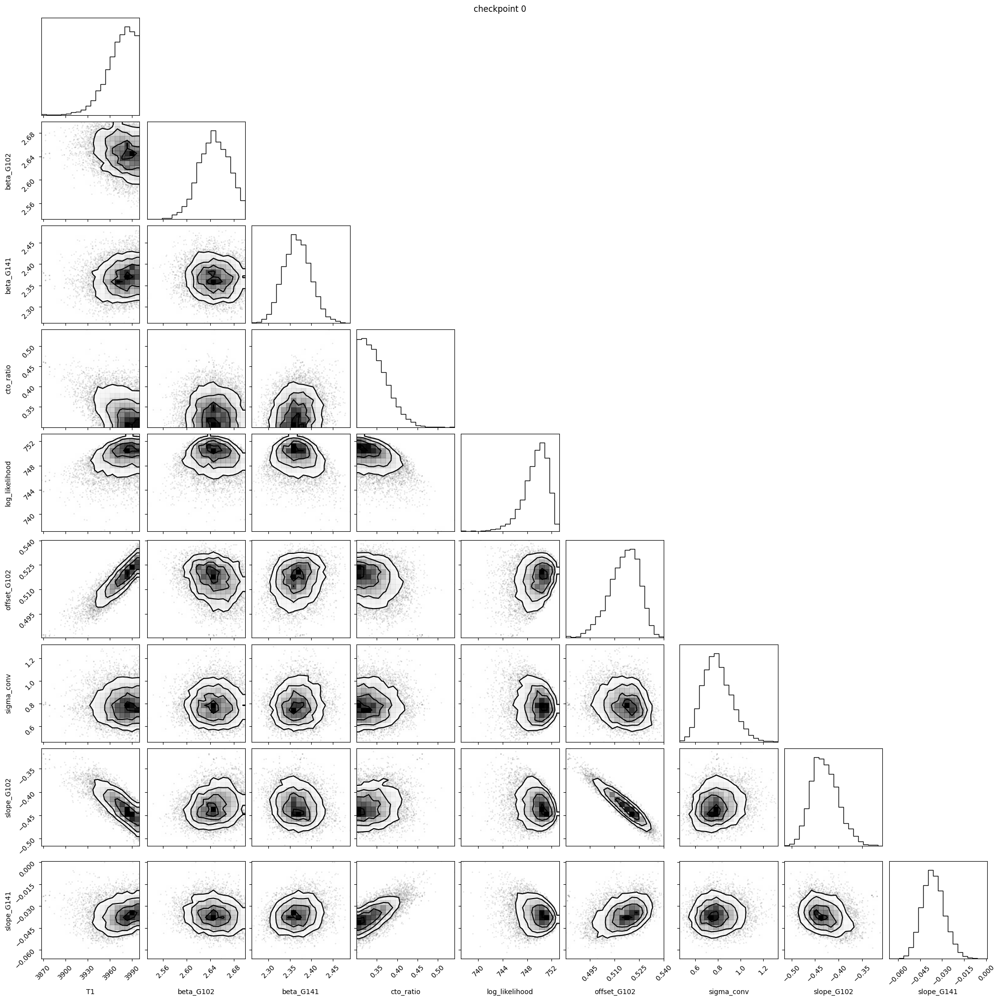

Median parameters from samples:
  T1: 3976.168905
  beta_G102: 2.646596
  beta_G141: 2.366517
  cto_ratio: 0.340835
  log_likelihood: 749.686610
  offset_G102: 0.516591
  sigma_conv: 0.784723
  slope_G102: -0.431590
  slope_G141: -0.036189
Maximum log likelihood: 753.250244
BIC: -1462.393059


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Corner for checkpoint 1


/opt/anaconda3/envs/pyjax312/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


<Figure size 640x480 with 0 Axes>

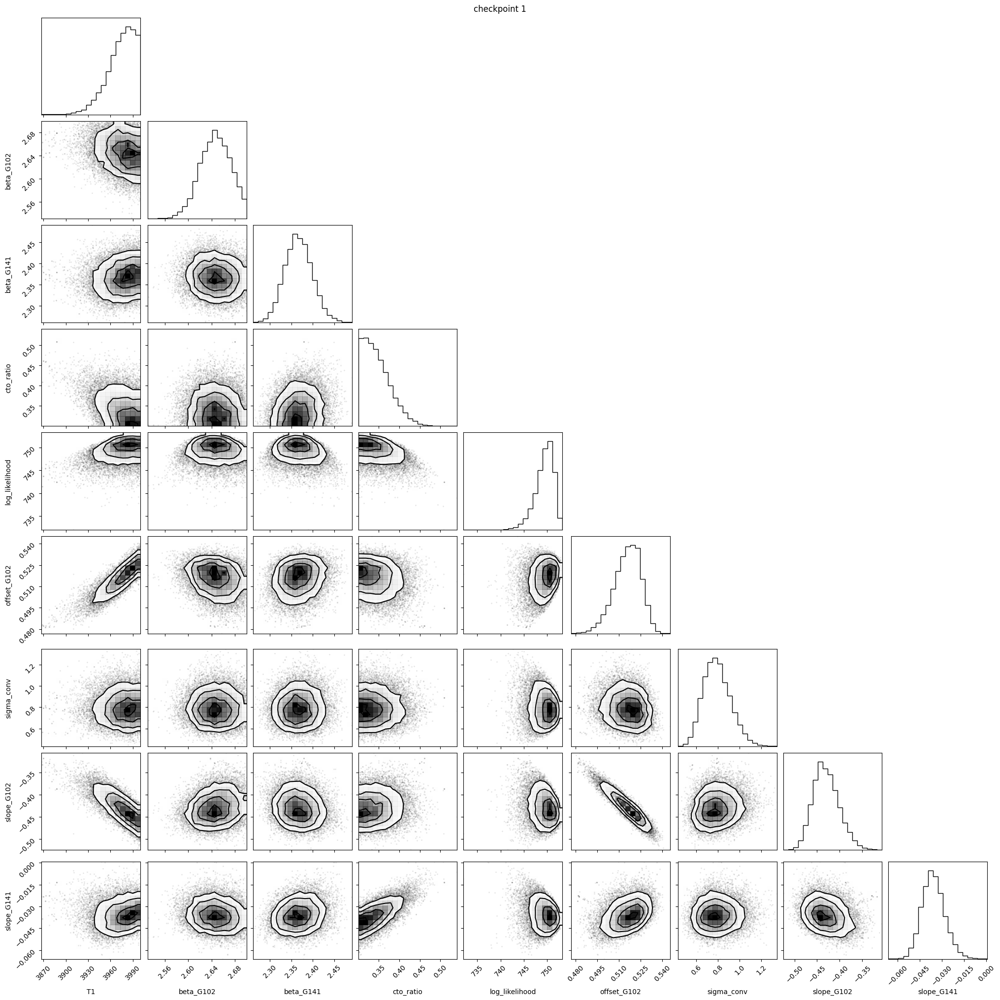

Median parameters from samples:
  T1: 3976.425333
  beta_G102: 2.646501
  beta_G141: 2.366392
  cto_ratio: 0.340465
  log_likelihood: 749.685049
  offset_G102: 0.516592
  sigma_conv: 0.784783
  slope_G102: -0.431817
  slope_G141: -0.036212
Maximum log likelihood: 753.250244
BIC: -1462.393059

                   mean       std    median      5.0%     95.0%     n_eff     r_hat
           T1   3973.05     19.26   3976.43   3946.82   4000.00   4593.33      1.00
    beta_G102      2.65      0.03      2.65      2.61      2.69   7475.60      1.00
    beta_G141      2.37      0.03      2.37      2.31      2.42  10039.60      1.00
    cto_ratio      0.35      0.03      0.34      0.30      0.39   7468.79      1.00
  offset_G102      0.52      0.01      0.52      0.50      0.53   4617.25      1.00
   sigma_conv      0.79      0.12      0.78      0.59      0.99   9994.88      1.00
   slope_G102     -0.43      0.03     -0.43     -0.48     -0.38   5029.87      1.00
   slope_G141     -0.04      0.01 

<Figure size 640x480 with 0 Axes>

In [6]:
n_temps = 1
n_warmup = 5_00
n_samples = 2_000
n_chains = 8
n_check = 2
model_designation = f'jointvisit_{n_temps}T_{n_samples}_{n_chains}chains_SED_sphinx_logg4.5_met0'

# Get the model function and callback
model_func, get_max_likelihood = numpyro_model(N_temps=n_temps, return_max_likelihood=True)

rng_key = PRNGKey(42)

sampler = NUTS(
    model_func,  # Use the returned function
    dense_mass=False
)

mcmc = MCMCWithCheckpoints(
    sampler, 
    num_warmup=n_warmup, 
    num_samples=n_samples,
    num_chains=n_chains
)

mcmc.run_checkpoints(rng_key, n_checkpoints=n_check, on_checkpoint=post_batch_viz_save)

mcmc.print_summary()

result = arviz.from_numpyro(mcmc)

'Save the result'
result.to_netcdf(f'../../data/samples/{model_designation}')

'Print the summary'
arviz.summary(result)

# Extract maximum likelihood after sampling
if get_max_likelihood is not None:
    samples = mcmc.get_samples()
    max_log_lik = get_max_likelihood(samples)
    print(f"Maximum log likelihood: {max_log_lik:.6f}")

In [7]:
'Examine the Leave-One-Out (LOO) summary'
loo = arviz.loo(result, pointwise=True)
loo

Computed from 16000 posterior samples and 242 observations log-likelihood matrix.

         Estimate       SE
elpd_loo   745.91    13.51
p_loo        6.58        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      242  100.0%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%

/opt/anaconda3/envs/pyjax312/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(



Temperature components: ['3992K']

FILLING FACTORS FOR EACH COMPONENT (from full posterior)
Component 1 (T = 3992K):
  Median = 1.0000 (100.00%)
  Mean ± Std = 1.0000 ± 0.0000
  16th-84th percentile = [1.0000, 1.0000]
  Range = [1.0000, 1.0000]

Sum of median filling factors: 1.0000



/var/folders/vq/zxq380ws52q37mjjtbt9c7rh0000gp/T/ipykernel_86420/897900404.py:82: UserWarning: The figure layout has changed to tight
  plt.tight_layout()



Maximum Likelihood Filling Factors (for comparison):
  Component 1: 1.0000 (100.00%)
Plotting 200 random posterior samples...


/var/folders/vq/zxq380ws52q37mjjtbt9c7rh0000gp/T/ipykernel_86420/897900404.py:169: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


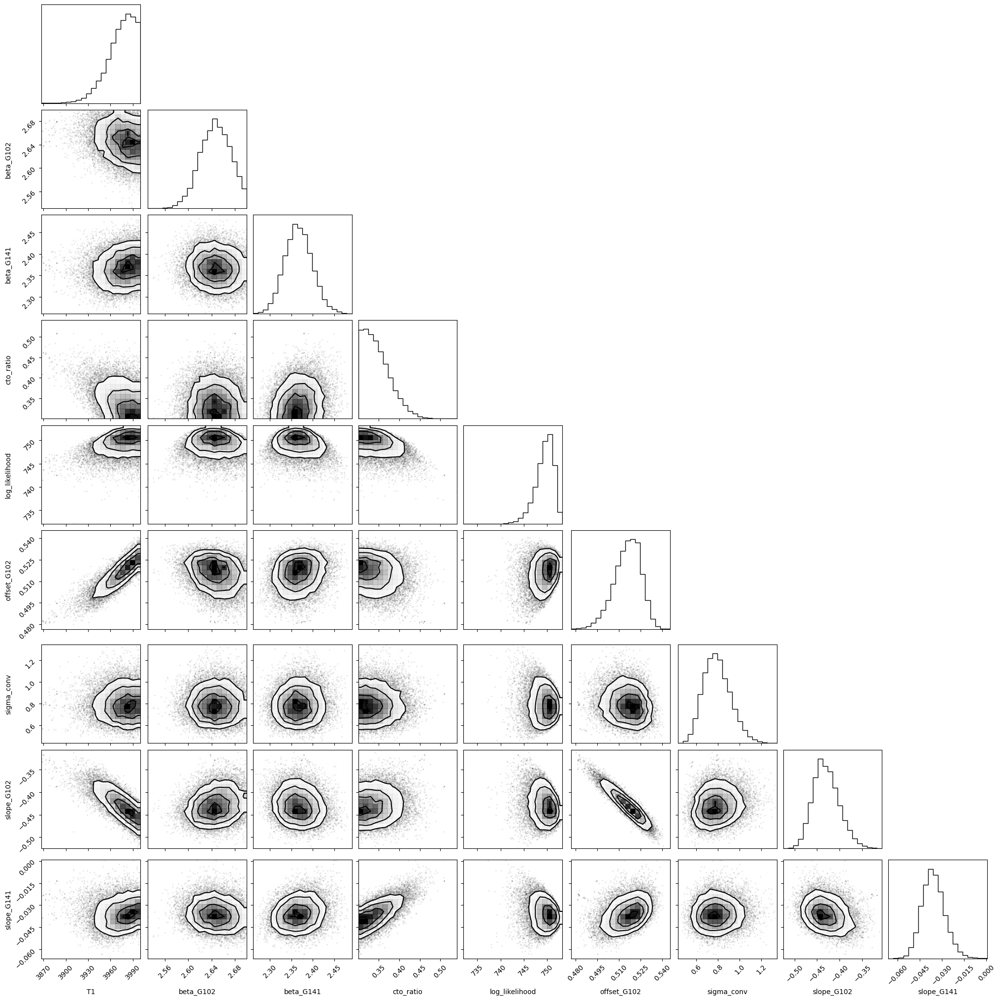

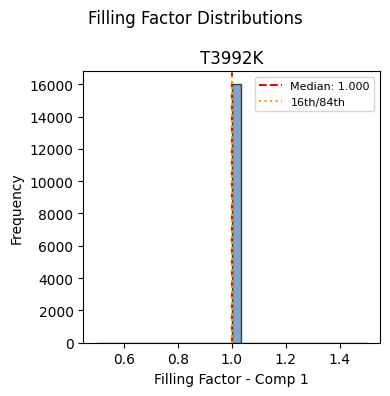

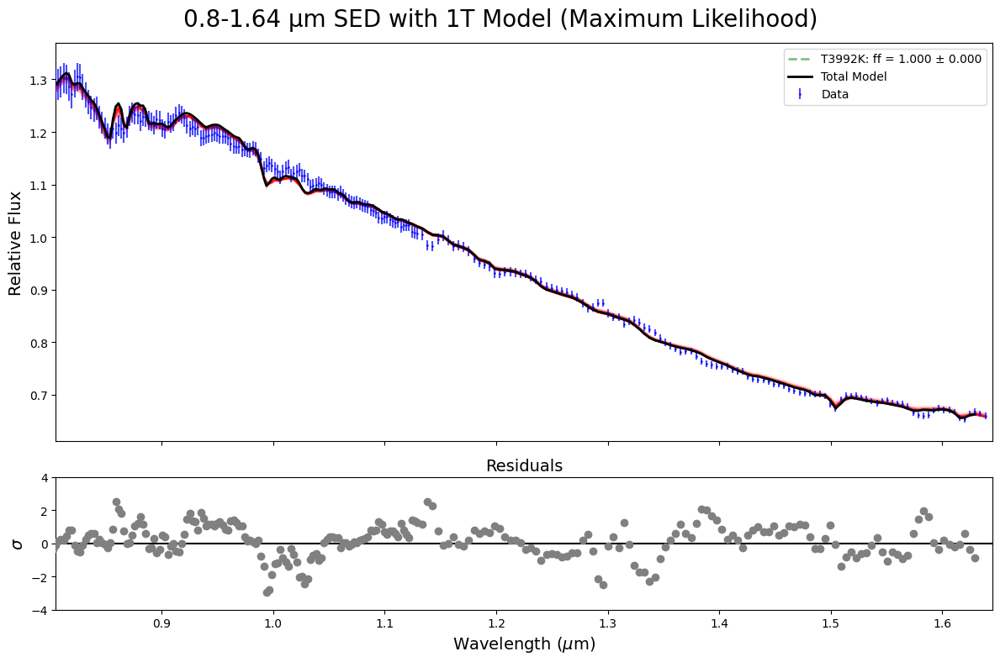

In [8]:
plot_sed_fit_results(mcmc, model_designation, n_temps)

## Run 2T Model

  0%|          | 0/3 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]




Begin 2000 samples with 3 checkpoints





  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/pyjax312/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


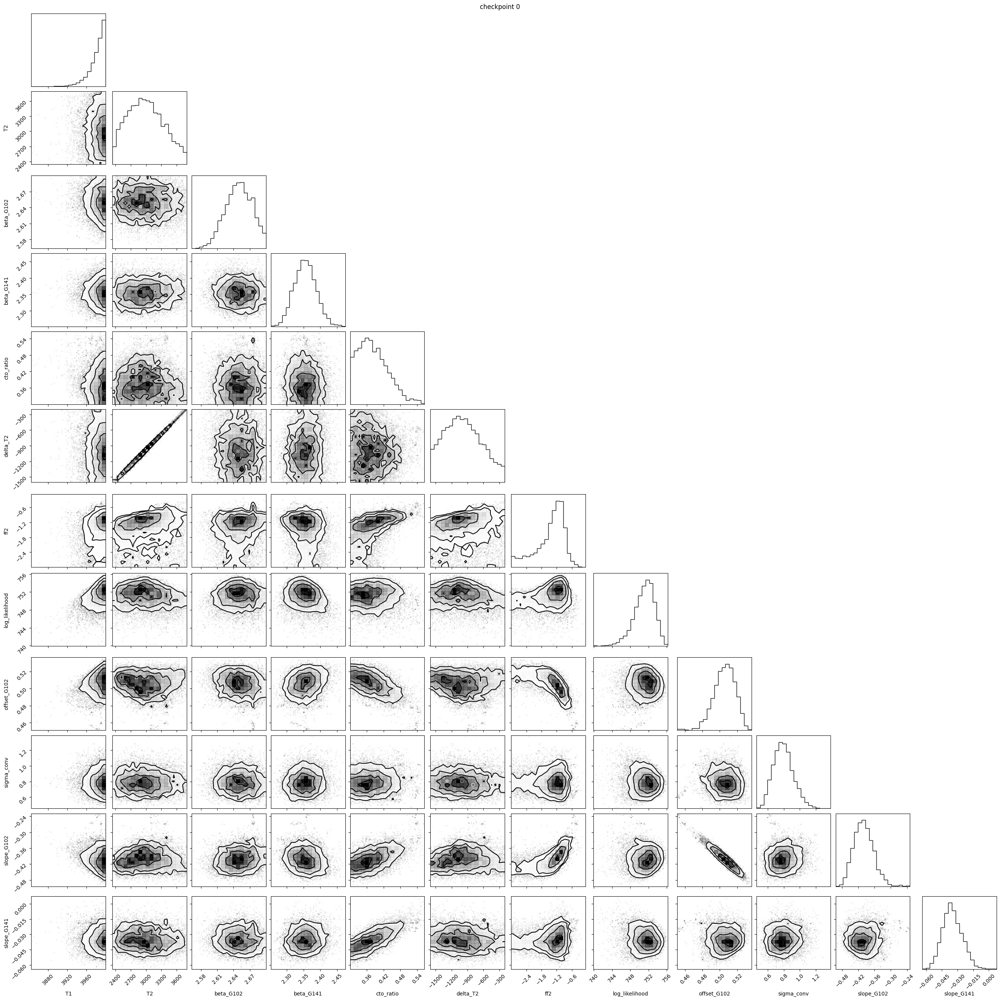

Median parameters from samples:
  T1: 3986.280056
  T2: 2979.488184
  beta_G102: 2.649984
  beta_G141: 2.354268
  cto_ratio: 0.375574
  delta_T2: -1004.181797
  ff2: -1.300346
  log_likelihood: 751.259759
  offset_G102: 0.506008
  sigma_conv: 0.786997
  slope_G102: -0.401778
  slope_G141: -0.035633
Maximum log likelihood: 756.202359
BIC: -1451.757002


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Corner for checkpoint 1


/opt/anaconda3/envs/pyjax312/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


<Figure size 640x480 with 0 Axes>

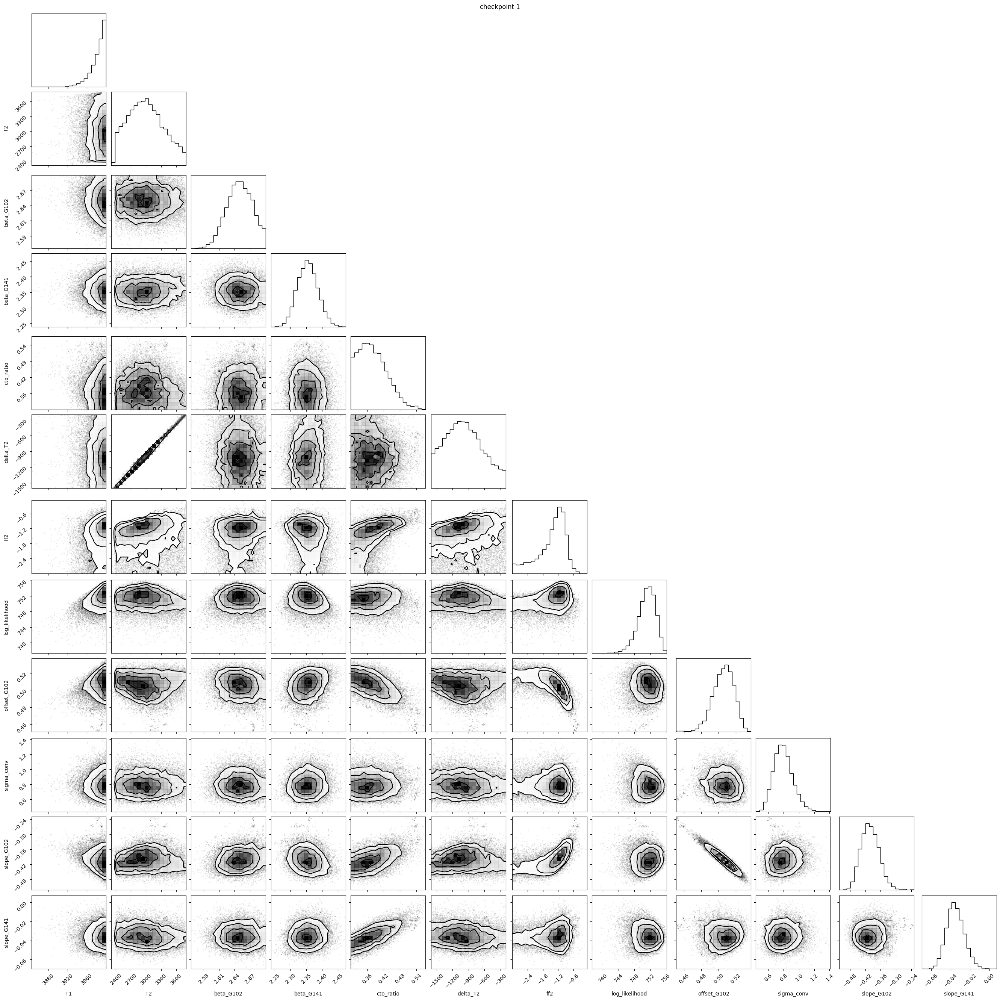

Median parameters from samples:
  T1: 3986.845731
  T2: 2981.803284
  beta_G102: 2.649549
  beta_G141: 2.353893
  cto_ratio: 0.375183
  delta_T2: -1001.585712
  ff2: -1.311325
  log_likelihood: 751.295241
  offset_G102: 0.506382
  sigma_conv: 0.786708
  slope_G102: -0.403046
  slope_G141: -0.035636
Maximum log likelihood: 756.202359
BIC: -1451.757002

                   mean       std    median      5.0%     95.0%     n_eff     r_hat
           T1   3982.29     16.27   3986.85   3960.71   4000.00   4474.89      1.00
    beta_G102      2.65      0.02      2.65      2.61      2.69   3579.61      1.00
    beta_G141      2.35      0.03      2.35      2.30      2.41   4867.84      1.00
    cto_ratio      0.38      0.05      0.38      0.30      0.45   1606.83      1.00
     delta_T2   -981.74    342.29  -1001.59  -1599.52   -493.16  10040.25      1.00
          ff2     -1.46      0.55     -1.31     -2.45     -0.67   2159.76      1.00
  offset_G102      0.51      0.01      0.51      0.49     

<Figure size 640x480 with 0 Axes>

In [9]:
n_temps = 2
n_warmup = 5_00
n_samples = 2_000
n_chains = 8
n_check = 2

model_designation = f'jointvisit_{n_temps}T_{n_samples}_{n_chains}chains_SED_sphinx_logg4.5_met0'

# Get the model function and callback
model_func, get_max_likelihood = numpyro_model(N_temps=n_temps, return_max_likelihood=True)

rng_key = PRNGKey(42)

sampler = NUTS(
    model_func,  # Use the returned function
    dense_mass=False
)

mcmc = MCMCWithCheckpoints(
    sampler, 
    num_warmup=n_warmup, 
    num_samples=n_samples,
    num_chains=n_chains
)

mcmc.run_checkpoints(rng_key, n_checkpoints=n_check, on_checkpoint=post_batch_viz_save)

mcmc.print_summary()

result = arviz.from_numpyro(mcmc)

'Save the result'
result.to_netcdf(f'../../data/samples/{model_designation}')

'Print the summary'
arviz.summary(result)
# Extract maximum likelihood after sampling
if get_max_likelihood is not None:
    samples = mcmc.get_samples()
    max_log_lik = get_max_likelihood(samples)
    print(f"Maximum log likelihood: {max_log_lik:.6f}")

In [10]:
'Examine the Leave-One-Out (LOO) summary'
loo = arviz.loo(result, pointwise=True)
loo

Computed from 16000 posterior samples and 242 observations log-likelihood matrix.

         Estimate       SE
elpd_loo   747.18    13.75
p_loo        7.38        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      242  100.0%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%

/opt/anaconda3/envs/pyjax312/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(



Temperature components: ['4000K', '2855K']

FILLING FACTORS FOR EACH COMPONENT (from full posterior)
Component 1 (T = 4000K):
  Median = 0.9534 (95.34%)
  Mean ± Std = 0.9452 ± 0.0460
  16th-84th percentile = [0.9035, 0.9909]
  Range = [0.5359, 0.9990]
Component 2 (T = 2855K):
  Median = 0.0466 (4.66%)
  Mean ± Std = 0.0548 ± 0.0460
  16th-84th percentile = [0.0091, 0.0965]
  Range = [0.0010, 0.4641]

Sum of median filling factors: 1.0000


Maximum Likelihood Filling Factors (for comparison):
  Component 1: 0.9170 (91.70%)
  Component 2: 0.0830 (8.30%)


/var/folders/vq/zxq380ws52q37mjjtbt9c7rh0000gp/T/ipykernel_86420/897900404.py:82: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


Plotting 200 random posterior samples...


/var/folders/vq/zxq380ws52q37mjjtbt9c7rh0000gp/T/ipykernel_86420/897900404.py:169: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


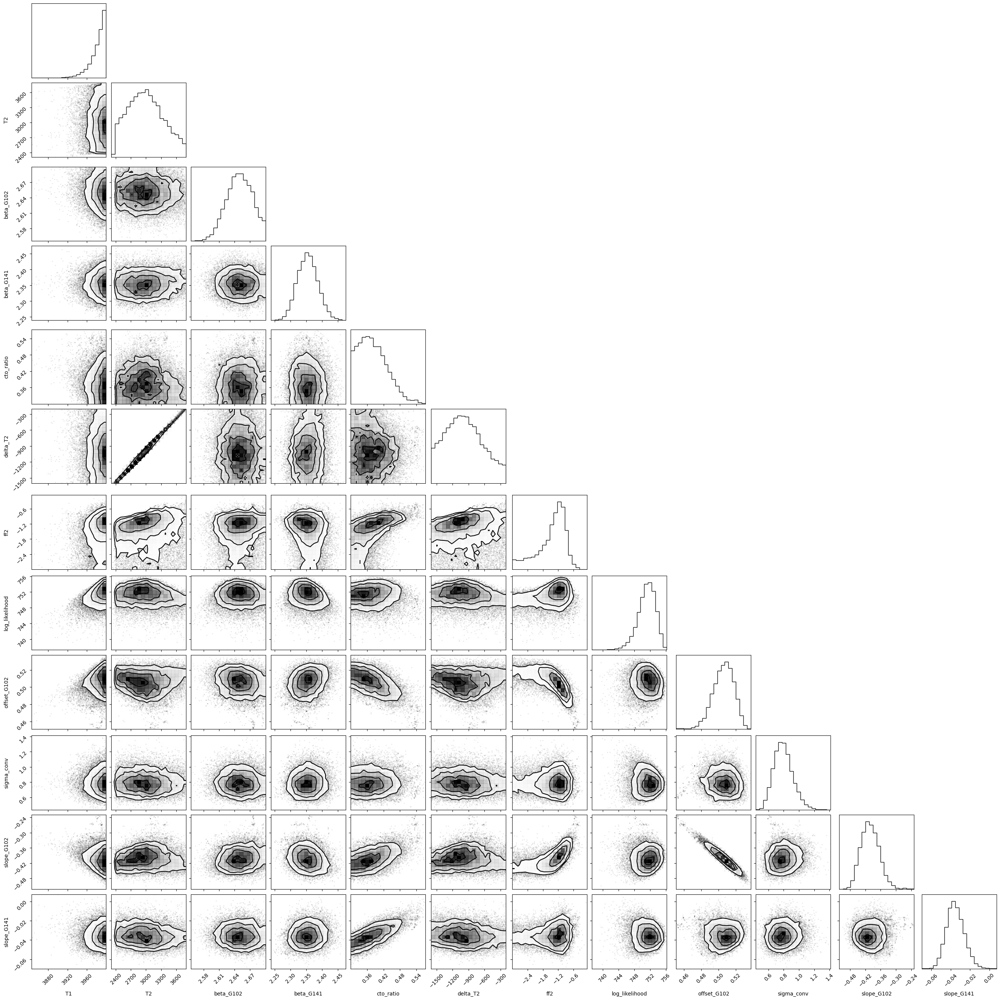

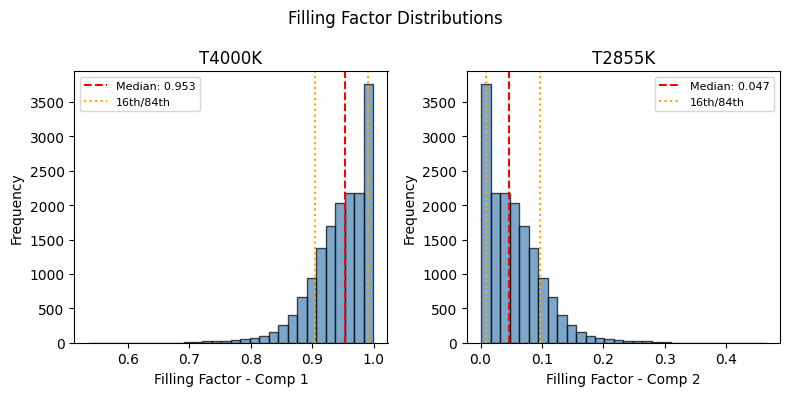

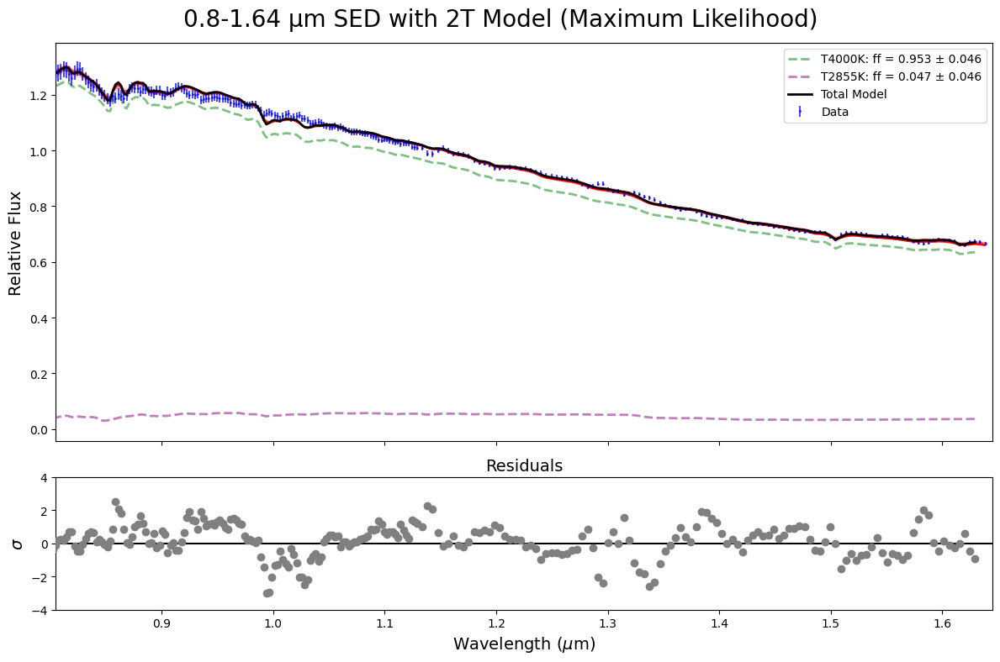

In [11]:
plot_sed_fit_results(mcmc, model_designation, n_temps)

## Run 3T Model

  0%|          | 0/3 [00:00<?, ?it/s]




Begin warmup





  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]

  0%|          | 0/500 [00:00<?, ?it/s]




Begin 2000 samples with 3 checkpoints





  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Corner for checkpoint 0


/opt/anaconda3/envs/pyjax312/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


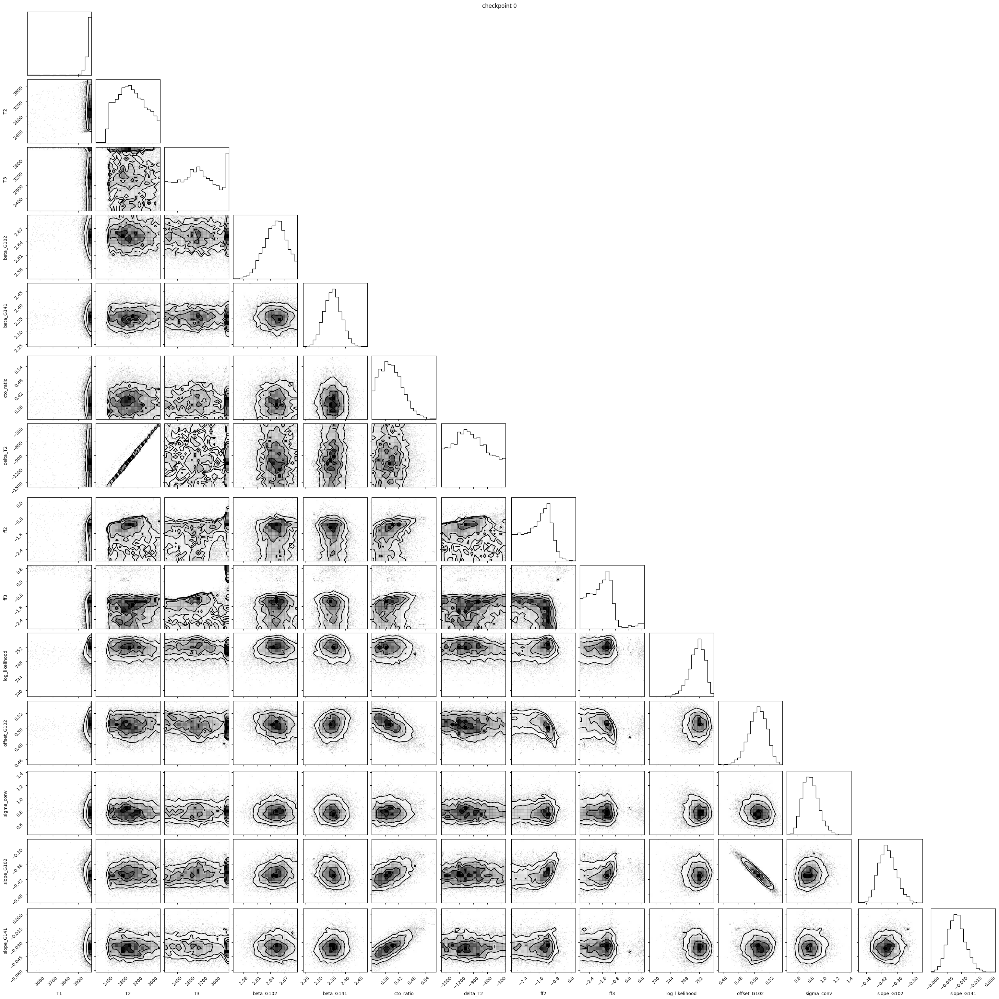

Median parameters from samples:
  T1: 3988.155202
  T2: 3006.367801
  T3: 3016.328342
  beta_G102: 2.651841
  beta_G141: 2.351916
  cto_ratio: 0.382021
  delta_T2: -972.564622
  ff2: -1.618048
  ff3: -1.678707
  log_likelihood: 751.536503
  offset_G102: 0.504683
  sigma_conv: 0.786354
  slope_G102: -0.399320
  slope_G141: -0.035291
Maximum log likelihood: 755.989324
BIC: -1440.304073


  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/1000 [00:00<?, ?it/s]

Corner for checkpoint 1


/opt/anaconda3/envs/pyjax312/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(


<Figure size 640x480 with 0 Axes>

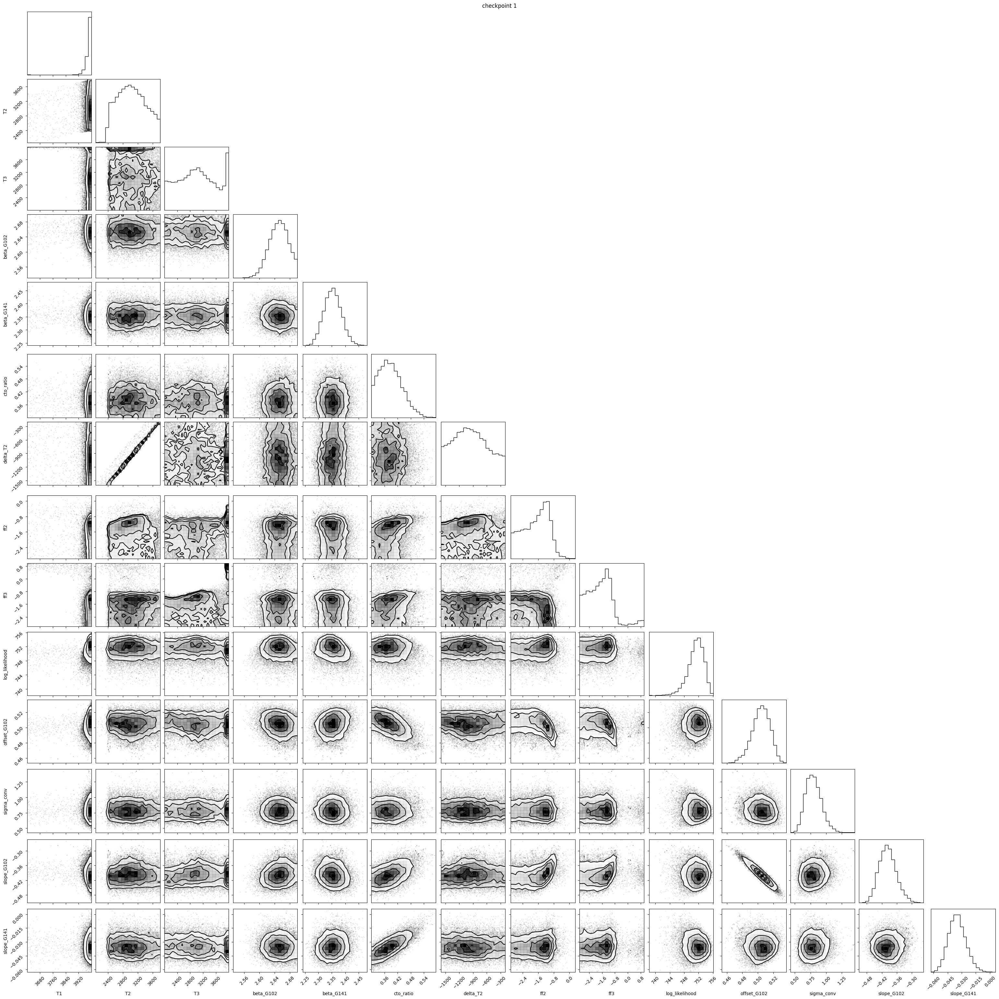

Median parameters from samples:
  T1: 3987.909057
  T2: 3019.761230
  T3: 3007.352473
  beta_G102: 2.651439
  beta_G141: 2.352194
  cto_ratio: 0.382900
  delta_T2: -961.504460
  ff2: -1.616021
  ff3: -1.689515
  log_likelihood: 751.476276
  offset_G102: 0.504484
  sigma_conv: 0.788146
  slope_G102: -0.398650
  slope_G141: -0.035206
Maximum log likelihood: 756.124356
BIC: -1440.574138

                   mean       std    median      5.0%     95.0%     n_eff     r_hat
           T1   3978.78     38.80   3987.91   3959.68   4000.00   1797.25      1.01
           T3   3019.10    568.76   3007.35   2226.21   3999.98   3976.41      1.00
    beta_G102      2.65      0.02      2.65      2.61      2.70   6389.97      1.00
    beta_G141      2.35      0.03      2.35      2.30      2.41   6844.34      1.00
    cto_ratio      0.39      0.05      0.38      0.30      0.46   2681.08      1.00
     delta_T2   -942.17    370.48   -961.50  -1585.35   -389.43   7599.47      1.00
          ff2     -1.72 

<Figure size 640x480 with 0 Axes>

In [12]:
n_temps = 3
n_warmup = 5_00
n_samples = 2_000
n_chains = 8
n_check = 2

model_designation = f'jointvisit_{n_temps}T_{n_samples}_{n_chains}chains_SED_sphinx_logg4.5_met0'

# Get the model function and callback
model_func, get_max_likelihood = numpyro_model(N_temps=n_temps, return_max_likelihood=True)

rng_key = PRNGKey(42)
# rng_keys = random.split(rng_key, n_chains)

sampler = NUTS(
    model_func,  # Use the returned function
    dense_mass=False
)

mcmc = MCMCWithCheckpoints(
    sampler, 
    num_warmup=n_warmup, 
    num_samples=n_samples,
    num_chains=n_chains
)

mcmc.run_checkpoints(rng_key, n_checkpoints=n_check, on_checkpoint=post_batch_viz_save)

mcmc.print_summary()

result = arviz.from_numpyro(mcmc)

'Save the result'
result.to_netcdf(f'../../data/samples/{model_designation}')

'Print the summary'
arviz.summary(result)

# Extract maximum likelihood after sampling
if get_max_likelihood is not None:
    samples = mcmc.get_samples()
    max_log_lik = get_max_likelihood(samples)
    print(f"Maximum log likelihood: {max_log_lik:.6f}")

In [13]:
'Examine the Leave-One-Out (LOO) summary'
loo = arviz.loo(result, pointwise=True)
loo

Computed from 16000 posterior samples and 242 observations log-likelihood matrix.

         Estimate       SE
elpd_loo   747.34    13.79
p_loo        7.37        -
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.70]   (good)      242  100.0%
   (0.70, 1]   (bad)         0    0.0%
   (1, Inf)   (very bad)    0    0.0%

/opt/anaconda3/envs/pyjax312/lib/python3.12/site-packages/corner/core.py:133: UserWarning: This figure was using a layout engine that is incompatible with subplots_adjust and/or tight_layout; not calling subplots_adjust.
  fig.subplots_adjust(



Temperature components: ['3998K', '3149K', '3384K']

FILLING FACTORS FOR EACH COMPONENT (from full posterior)
Component 1 (T = 3998K):
  Median = 0.9365 (93.65%)
  Mean ± Std = 0.8997 ± 0.1542
  16th-84th percentile = [0.8777, 0.9752]
  Range = [0.0795, 0.9978]
Component 2 (T = 3149K):
  Median = 0.0218 (2.18%)
  Mean ± Std = 0.0362 ± 0.0398
  16th-84th percentile = [0.0029, 0.0732]
  Range = [0.0001, 0.4626]
Component 3 (T = 3384K):
  Median = 0.0193 (1.93%)
  Mean ± Std = 0.0642 ± 0.1524
  16th-84th percentile = [0.0027, 0.0768]
  Range = [0.0007, 0.9089]

Sum of median filling factors: 0.9776



/var/folders/vq/zxq380ws52q37mjjtbt9c7rh0000gp/T/ipykernel_86420/897900404.py:82: UserWarning: The figure layout has changed to tight
  plt.tight_layout()



Maximum Likelihood Filling Factors (for comparison):
  Component 1: 0.8782 (87.82%)
  Component 2: 0.1207 (12.07%)
  Component 3: 0.0011 (0.11%)
Plotting 200 random posterior samples...


/var/folders/vq/zxq380ws52q37mjjtbt9c7rh0000gp/T/ipykernel_86420/897900404.py:169: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


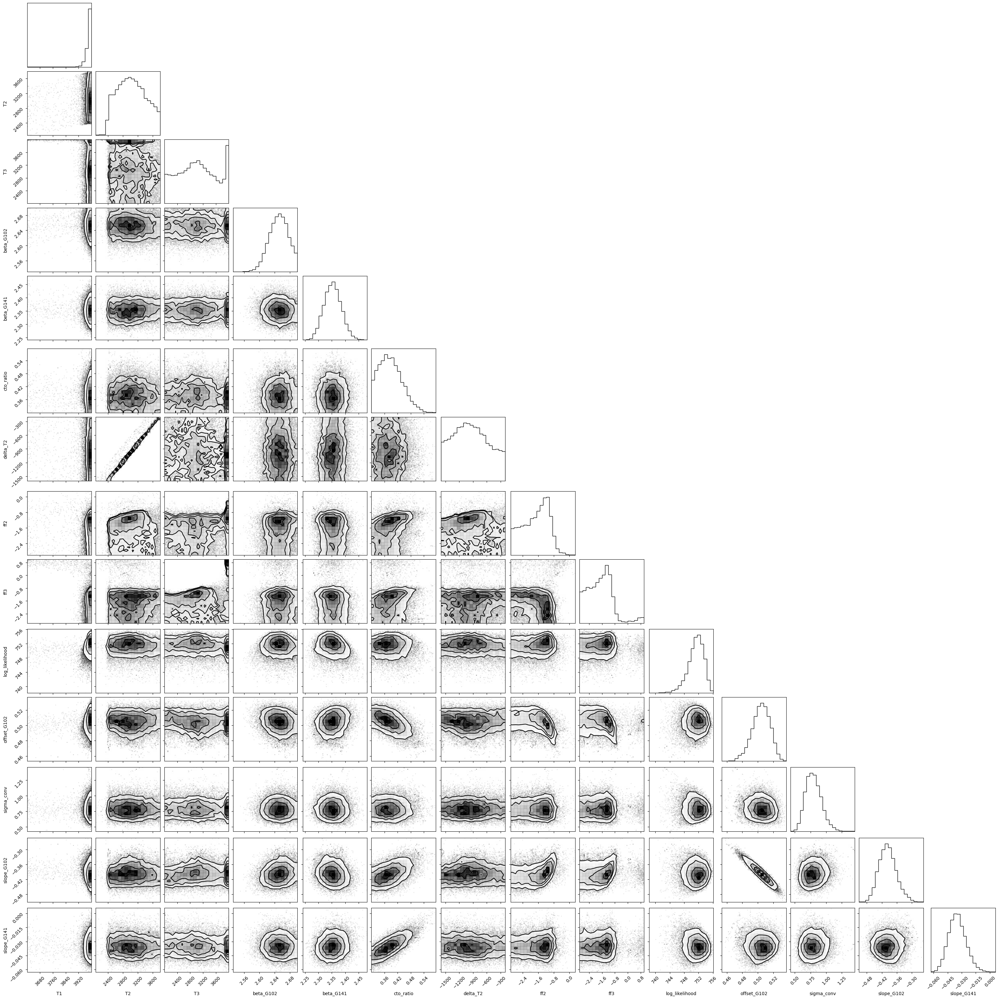

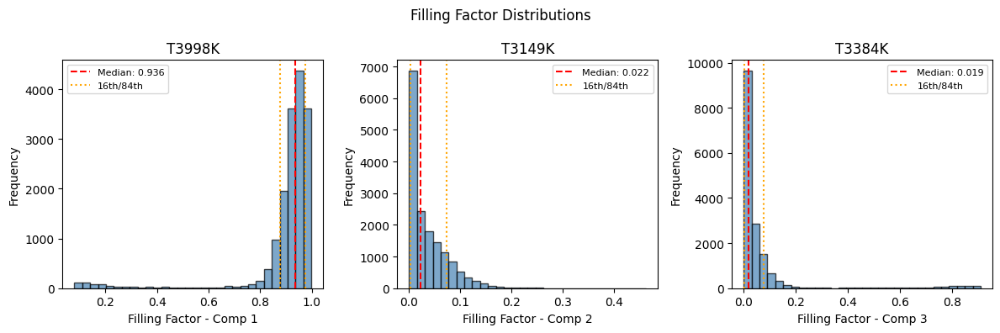

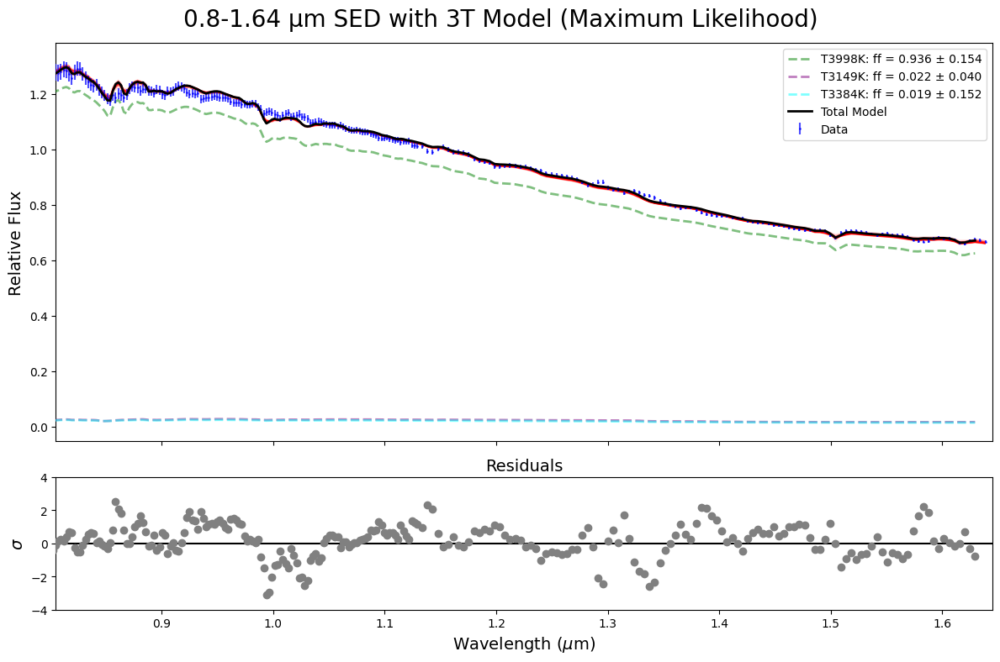

In [14]:
plot_sed_fit_results(mcmc, model_designation, n_temps)

# Compare multiple models of the same dataset

In [15]:
compare_dict = {}

compare_dict['Sphinx1T'] = arviz.InferenceData.from_netcdf('../../data/samples/jointvisit_1T_2000_8chains_SED_sphinx_logg4.5')
compare_dict['Sphinx2T'] = arviz.InferenceData.from_netcdf('../../data/samples/jointvisit_2T_2000_8chains_SED_sphinx_logg4.5')
compare_dict['Sphinx3T'] = arviz.InferenceData.from_netcdf('../../data/samples/jointvisit_3T_2000_8chains_SED_sphinx_logg4.5')
compare_dict['Sphinx1T_met0'] = arviz.InferenceData.from_netcdf('../../data/samples/jointvisit_1T_2000_8chains_SED_sphinx_logg4.5_met0')
compare_dict['Sphinx2T_met0'] = arviz.InferenceData.from_netcdf('../../data/samples/jointvisit_2T_2000_8chains_SED_sphinx_logg4.5_met0')
compare_dict['Sphinx3T_met0'] = arviz.InferenceData.from_netcdf('../../data/samples/jointvisit_3T_2000_8chains_SED_sphinx_logg4.5_met0')

arviz.compare(compare_dict)

,rank,elpd_loo,p_loo,elpd_diff,weight,se,dse,warning,scale
Sphinx3T,0,751.438683,8.219443,0.000000,1.000000e+00,14.243885,0.000000,False,log
Sphinx2T,1,751.073770,8.345267,0.364912,1.526557e-15,14.215558,0.224059,False,log
Sphinx1T,2,749.551636,7.986337,1.887047,2.688808e-15,14.037168,0.977042,False,log
Sphinx3T_met0,3,747.341718,7.371914,4.096965,1.556059e-15,13.789404,2.312994,False,log
Sphinx2T_met0,4,747.177488,7.382236,4.261195,2.195847e-15,13.754108,2.384034,False,log
Sphinx1T_met0,5,745.912721,6.580171,5.525962,0.000000e+00,13.508512,2.926522,False,log


From https://num.pyro.ai/en/latest/tutorials/bad_posterior_geometry.html

In general it is difficult to assess whether the samples returned from HMC or NUTS represent accurate (approximate) samples from the posterior. Two general rules of thumb, however, are to look at the effective sample size (ESS) and r_hat diagnostics returned by mcmc.print_summary(). If we see values of r_hat in the range (1.0, 1.05) and effective sample sizes that are comparable to the total number of samples num_samples (assuming thinning=1) then we have good reason to believe that HMC is doing a good job. If, however, we see low effective sample sizes or large r_hats for some of the variables (e.g. r_hat = 1.15) then HMC is likely struggling with the posterior geometry. In the following we will use r_hat as our primary diagnostic metric.